## Import Libraries

In [1]:
# === Step 1: Import Libraries ===
import os
import pandas as pd
import numpy as np
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score, classification_report, multilabel_confusion_matrix, precision_recall_curve
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from torchvision import models
import matplotlib.pyplot as plt
import seaborn as sns

## Identify Device

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cpu


## File Reading

In [5]:
# === Step 2: Load CSV Files ===
train_features = pd.read_csv("train_features.csv")
train_labels = pd.read_csv("train_labels.csv")
test_features = pd.read_csv("test_features.csv")

In [7]:
# === Step 3: Setup Labels and Paths ===
label_columns = train_labels.columns[1:].tolist()
img_dir = r"C:\Users\Joel\!UMN\DATMOD\!PROJECT UAS\train_features"

In [9]:
# === Step 4: Dataset Class ===
class WildlifeDataset(Dataset):
    def __init__(self, df_features, df_labels=None, img_dir=None, transform=None):
        self.df = df_features.copy()
        self.labels = df_labels
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, os.path.basename(self.df.iloc[idx]['filepath']))
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        if self.labels is not None:
            label_row = self.labels[self.labels['id'] == self.df.iloc[idx]['id']].iloc[0, 1:].values.astype(np.float32)
            label = torch.tensor(label_row, dtype=torch.float32)
            return image, label
        else:
            return image

## EDA

In [11]:
# Menampilkan jumlah gambar dan label
print(f"Jumlah gambar: {len(train_features)}")
print(f"Jumlah label: {len(train_labels)}")

# Menampilkan distribusi label
label_counts = train_labels[label_columns].sum(axis=0)
print("Distribusi label:")
print(label_counts)

Jumlah gambar: 16488
Jumlah label: 16488
Distribusi label:
antelope_duiker     2474.0
bird                1641.0
blank               2213.0
civet_genet         2423.0
hog                  978.0
leopard             2254.0
monkey_prosimian    2492.0
rodent              2013.0
dtype: float64


In [13]:
# Cek gambar rusak
def check_invalid_images(df):
    invalid_images = []
    for idx, row in df.iterrows():
        try:
            img = Image.open(row['filepath'])
            img.verify()  # Cek apakah gambar bisa dibuka
        except:
            invalid_images.append(idx)
    return invalid_images

invalid_idx = check_invalid_images(train_features)
print(f"Jumlah gambar rusak: {len(invalid_idx)}")

Jumlah gambar rusak: 0


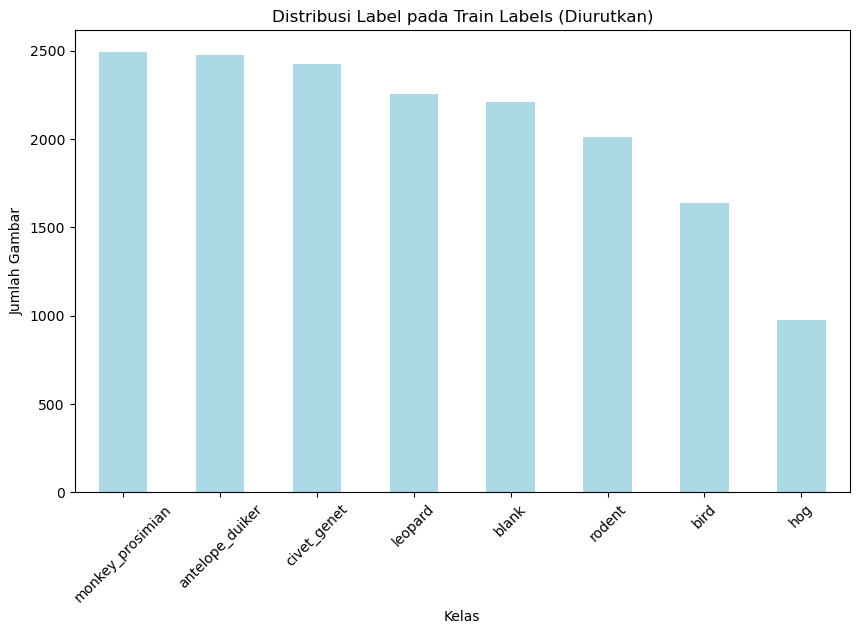

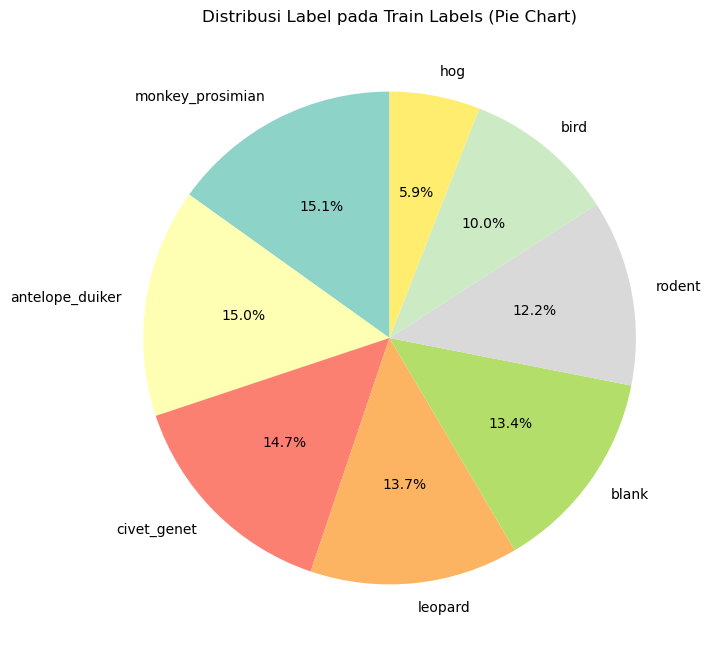

In [15]:
# Sort label distribution in descending order
sorted_label_distribution = label_counts.sort_values(ascending=False)

# Visualisasi distribusi label yang sudah diurutkan (bar chart)
plt.figure(figsize=(10, 6))
sorted_label_distribution.plot(kind='bar', color='lightblue')
plt.title('Distribusi Label pada Train Labels (Diurutkan)')
plt.xlabel('Kelas')
plt.ylabel('Jumlah Gambar')
plt.xticks(rotation=45)
plt.show()

# Visualisasi distribusi label menggunakan pie chart
plt.figure(figsize=(8, 8))
sorted_label_distribution.plot(kind='pie', autopct='%1.1f%%', startangle=90, cmap='Set3', legend=False)
plt.title('Distribusi Label pada Train Labels (Pie Chart)')
plt.ylabel('')  # Hides the ylabel
plt.show()

Ukuran gambar pertama: (960, 540)


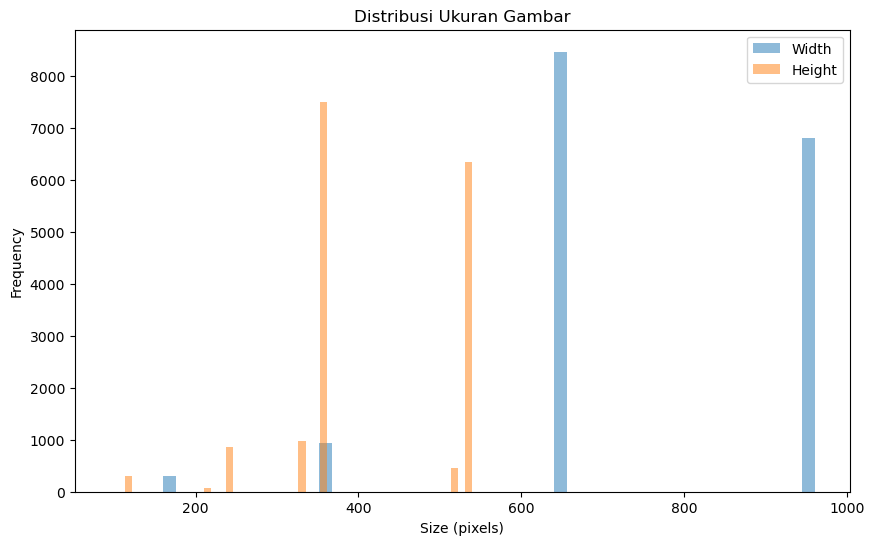

In [17]:
# Memeriksa ukuran gambar pertama
img_path = train_features.iloc[0]['filepath']
img = Image.open(img_path)
print(f"Ukuran gambar pertama: {img.size}")

# Menghitung distribusi ukuran gambar
image_sizes = []
for img_path in train_features['filepath']:
    img = Image.open(img_path)
    image_sizes.append(img.size)

# Plot distribusi ukuran gambar
widths, heights = zip(*image_sizes)
plt.figure(figsize=(10, 6))
plt.hist(widths, bins=50, alpha=0.5, label='Width')
plt.hist(heights, bins=50, alpha=0.5, label='Height')
plt.xlabel('Size (pixels)')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.title('Distribusi Ukuran Gambar')
plt.show()

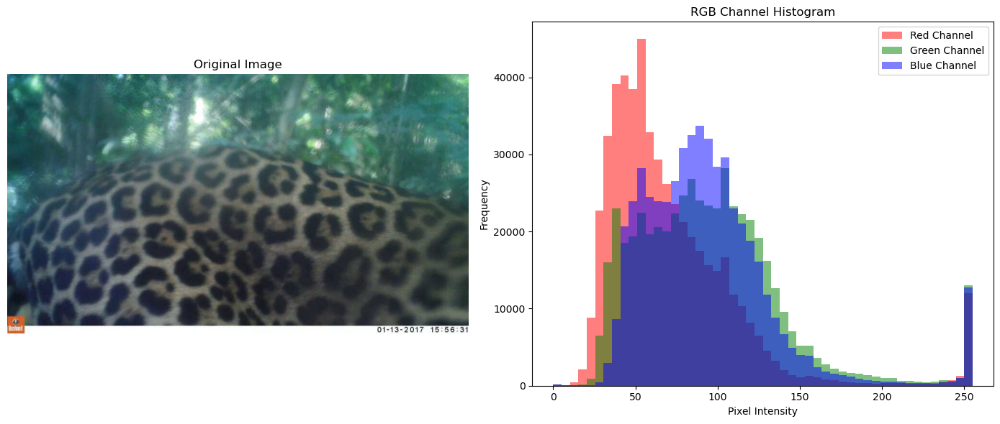

Average Red: 0.283
Average Green: 0.374
Average Blue: 0.368


In [21]:
# Fungsi untuk menampilkan gambar dan histogram RGB
def show_image_and_rgb_histogram(img_path):
    # Membaca gambar
    img = Image.open(img_path)
    
    # Mengonversi gambar ke format RGB
    img_rgb = np.array(img.convert("RGB"))
    
    # Menghitung histogram untuk setiap channel (Red, Green, Blue)
    red_hist = img_rgb[:, :, 0].flatten()
    green_hist = img_rgb[:, :, 1].flatten()
    blue_hist = img_rgb[:, :, 2].flatten()
    
    # Plotting gambar asli dan histogram RGB
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # Gambar asli
    axes[0].imshow(img)
    axes[0].axis('off')
    axes[0].set_title(f"Original Image")

    # RGB Histogram
    axes[1].hist(red_hist, bins=50, color='red', alpha=0.5, label='Red Channel')
    axes[1].hist(green_hist, bins=50, color='green', alpha=0.5, label='Green Channel')
    axes[1].hist(blue_hist, bins=50, color='blue', alpha=0.5, label='Blue Channel')
    
    axes[1].set_title("RGB Channel Histogram")
    axes[1].set_xlabel("Pixel Intensity")
    axes[1].set_ylabel("Frequency")
    axes[1].legend(loc='upper right')
    
    # Menampilkan visualisasi
    plt.tight_layout()
    plt.show()

    # Output nilai rata-rata intensitas per channel
    print(f"Average Red: {np.mean(red_hist) / 255:.3f}")
    print(f"Average Green: {np.mean(green_hist) / 255:.3f}")
    print(f"Average Blue: {np.mean(blue_hist) / 255:.3f}")

# Path gambar yang ingin ditampilkan
img_path =  r"C:\Users\Joel\!UMN\DATMOD\!PROJECT UAS\train_features\ZJ000008.jpg"  # Ganti dengan path gambar Anda
show_image_and_rgb_histogram(img_path)

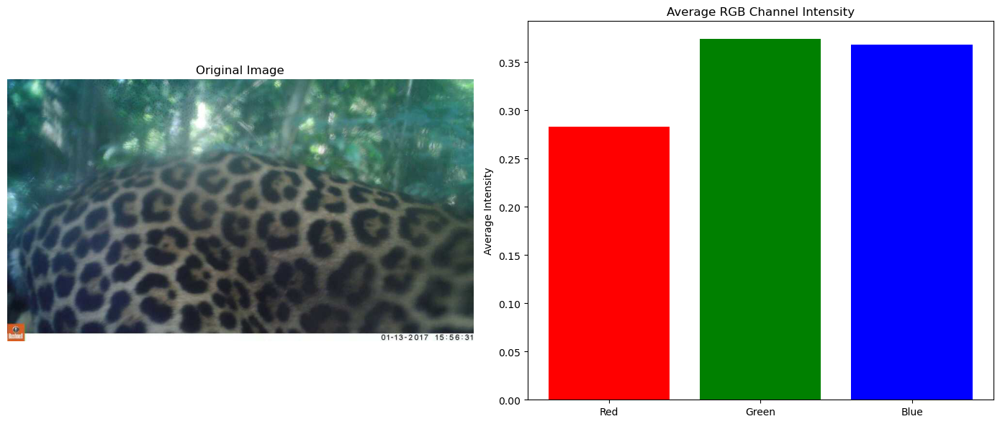

Average Red: 0.283
Average Green: 0.374
Average Blue: 0.368


In [23]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Fungsi untuk menampilkan gambar dan histogram rata-rata RGB
def show_image_and_rgb_intensity(img_path):
    # Membaca gambar
    img = Image.open(img_path)
    
    # Mengonversi gambar ke format RGB
    img_rgb = np.array(img.convert("RGB"))
    
    # Menghitung rata-rata intensitas untuk tiap channel (Red, Green, Blue)
    avg_red = np.mean(img_rgb[:, :, 0]) / 255  # Normalisasi ke range 0-1
    avg_green = np.mean(img_rgb[:, :, 1]) / 255
    avg_blue = np.mean(img_rgb[:, :, 2]) / 255
    
    # Menampilkan gambar asli
    fig, ax = plt.subplots(1, 2, figsize=(14, 6))

    # Gambar asli
    ax[0].imshow(img)
    ax[0].axis('off')
    ax[0].set_title(f"Original Image")

    # Menampilkan bar chart untuk RGB channel intensity
    channels = ['Red', 'Green', 'Blue']
    intensities = [avg_red, avg_green, avg_blue]
    
    ax[1].bar(channels, intensities, color=['red', 'green', 'blue'])
    ax[1].set_title("Average RGB Channel Intensity")
    ax[1].set_ylabel("Average Intensity")
    
    # Menampilkan visualisasi
    plt.tight_layout()
    plt.show()
    
    # Output nilai rata-rata
    print(f"Average Red: {avg_red:.3f}")
    print(f"Average Green: {avg_green:.3f}")
    print(f"Average Blue: {avg_blue:.3f}")

# Path gambar yang ingin ditampilkan
img_path = r"C:\Users\Joel\!UMN\DATMOD\!PROJECT UAS\train_features\ZJ000008.jpg"  # Ganti dengan path gambar Anda
show_image_and_rgb_intensity(img_path)


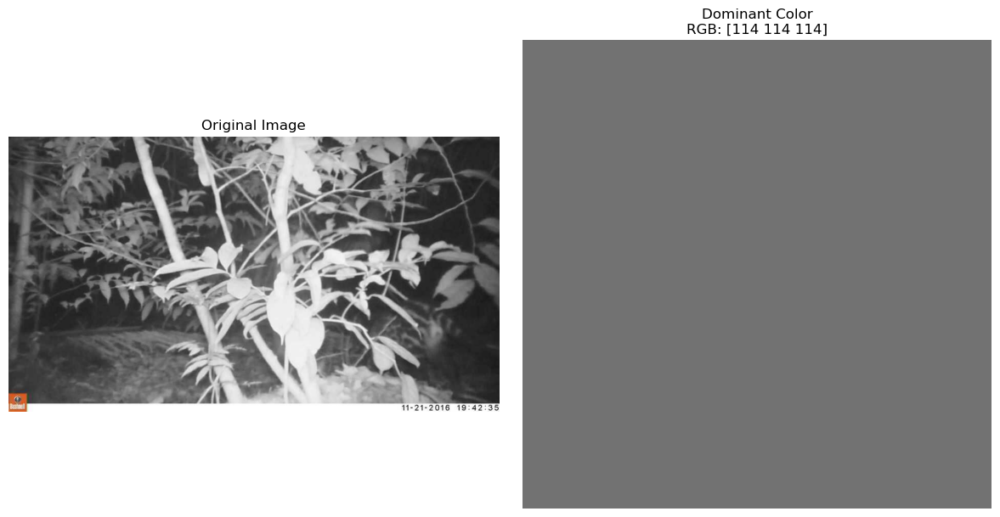

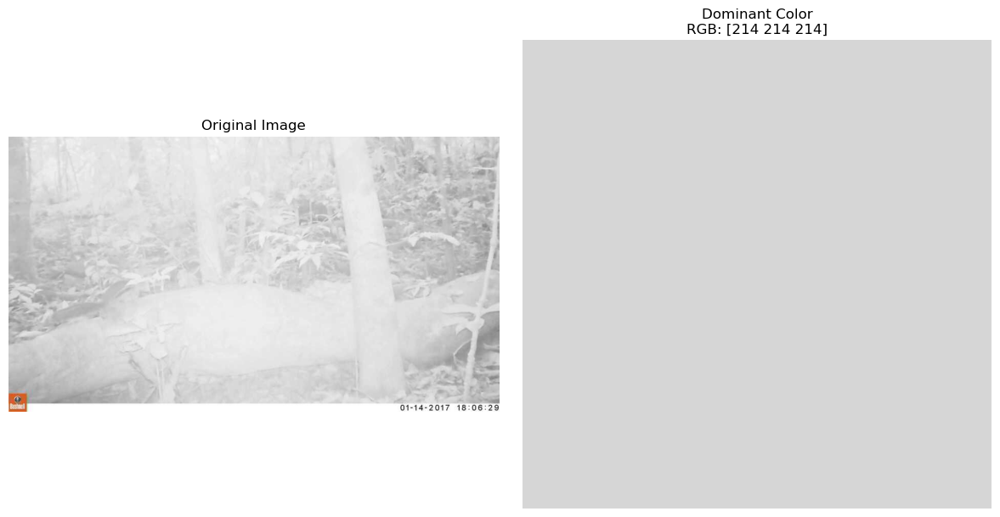

In [61]:
i# Fungsi untuk menampilkan warna dominan dan gambar
def plot_dominant_color_and_image(img_path):
    # Membaca gambar
    img = Image.open(img_path)
    
    # Mengonversi gambar ke RGB
    img_rgb = img.convert("RGB")
    
    # Mengubah gambar menjadi array 2D (setiap piksel sebagai satu baris)
    img_array = np.array(img_rgb).reshape(-1, 3)
    
    # Menggunakan KMeans untuk mencari warna dominan
    kmeans = KMeans(n_clusters=1)  # Menggunakan 1 cluster untuk mencari warna dominan
    kmeans.fit(img_array)
    
    # Mendapatkan warna dominan
    dominant_color = kmeans.cluster_centers_.astype(int)[0]
    
    # Menampilkan gambar asli dan warna dominan dalam satu plot
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    # Menampilkan gambar asli
    axes[0].imshow(img)
    axes[0].axis('off')
    axes[0].set_title("Original Image")
    
    # Menampilkan warna dominan
    axes[1].imshow([[dominant_color / 255]])  # Normalisasi warna
    axes[1].axis('off')
    axes[1].set_title(f'Dominant Color\nRGB: {dominant_color}')
    
    # Menampilkan visualisasi
    plt.tight_layout()
    plt.show()

# Contoh penggunaan: Ganti dengan path gambar yang sesuai
# Path ke folder test images (gunakan nama folder yang sesuai dengan data Anda)
test_folder = "test_features"  # Ganti dengan folder Anda yang berisi gambar uji

# Ambil beberapa gambar dari test folder untuk ditampilkan
sample_images = os.listdir(test_folder)[:2]  # Tampilkan 5 gambar pertama

for img_file in sample_images:
    img_path = os.path.join(test_folder, img_file)
    plot_dominant_color_and_image(img_path)

Gagal membaca gambar: test_features\.DS_Store


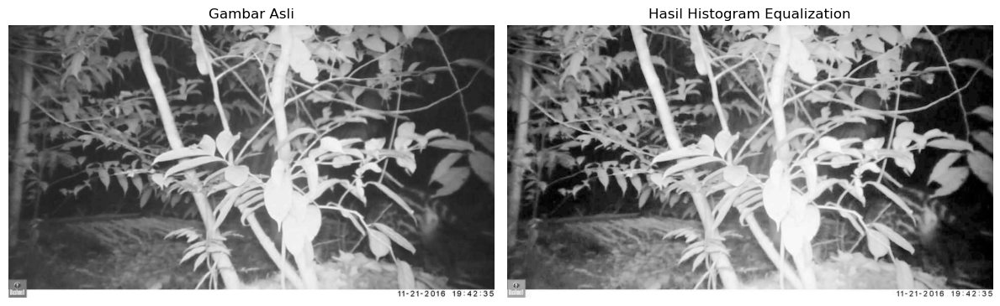

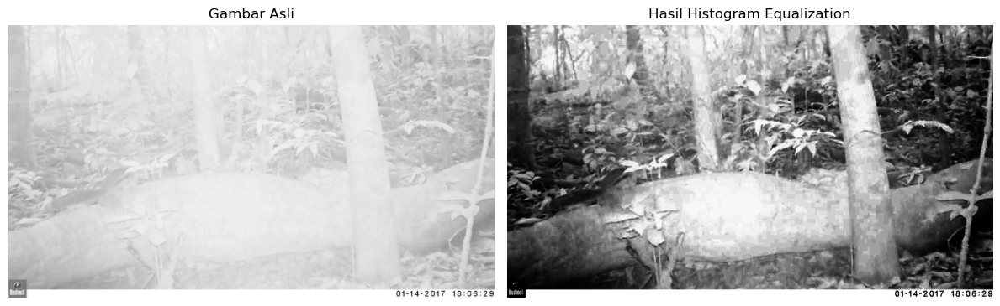

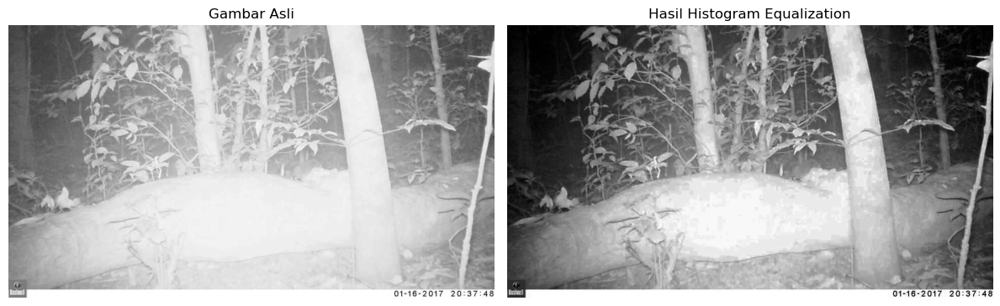

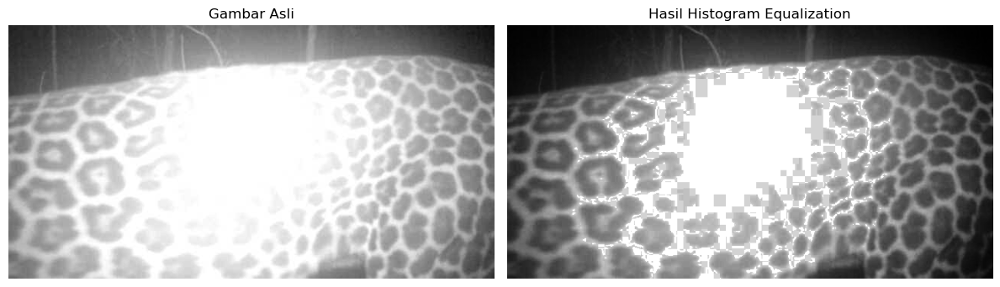

In [67]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Fungsi untuk menampilkan gambar asli dan hasil histogram equalization
def show_histogram_equalization(img_path):
    # Membaca gambar menggunakan OpenCV (dalam format grayscale)
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    # Cek apakah gambar berhasil dibaca
    if img is None:
        print(f"Gagal membaca gambar: {img_path}")
        return

    # Melakukan histogram equalization
    equalized_img = cv2.equalizeHist(img)
    
    # Menampilkan gambar asli dan gambar setelah equalization
    plt.figure(figsize=(12, 6))
    
    # Gambar asli
    plt.subplot(1, 2, 1)
    plt.imshow(img, cmap='gray')
    plt.title("Gambar Asli")
    plt.axis('off')
    
    # Gambar setelah histogram equalization
    plt.subplot(1, 2, 2)
    plt.imshow(equalized_img, cmap='gray')
    plt.title("Hasil Histogram Equalization")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Path ke folder test images
test_folder = "test_features"

# Ambil 5 gambar pertama dari folder
sample_images = os.listdir(test_folder)[:5]

# Tampilkan histogram equalization
for img_file in sample_images:
    img_path = os.path.join(test_folder, img_file)
    show_histogram_equalization(img_path)

## Pre Processing

In [27]:

# === Step 5: Data Augmentation & DataLoaders ===
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

from sklearn.model_selection import train_test_split

train_df, val_df = train_test_split(train_features, test_size=0.2, random_state=42)

train_dataset = WildlifeDataset(train_df, train_labels, img_dir, transform=train_transform)
val_dataset = WildlifeDataset(val_df, train_labels, img_dir, transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

In [29]:

# === Step 6: Hitung pos_weight untuk imbalanced loss ===
label_counts = train_labels[label_columns].sum().values
total_samples = len(train_labels)
pos_weights = torch.tensor((total_samples - label_counts) / (label_counts + 1e-8), dtype=torch.float32).to(device)


## Modeling

In [31]:

# === Step 7: Define Model ===
class DeeperMultiLabelModel(nn.Module):
    def __init__(self, num_classes):
        super(DeeperMultiLabelModel, self).__init__()
        self.model = models.resnet18(pretrained=True)
        self.model.fc = nn.Linear(self.model.fc.in_features, num_classes)

    def forward(self, x):
        return self.model(x)

model = DeeperMultiLabelModel(num_classes=len(label_columns)).to(device)
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weights)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)


C:\Users\Joel\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Joel\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to C:\Users\Joel/.cache\torch\hub\checkpoints\resnet18-f37072fd.pth
100%|█████████████████████████████████████████████████████████████████████████████| 44.7M/44.7M [00:06<00:00, 7.30MB/s]


### Training To Epoch 25

In [23]:
from tqdm import tqdm
from sklearn.metrics import f1_score, accuracy_score

num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}", leave=False)

    for images, labels in progress_bar:
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    avg_loss = running_loss / len(train_loader)

    # === Validation ===
    model.eval()
    val_loss = 0.0
    all_preds, all_targets = [], []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            preds = torch.sigmoid(outputs).cpu().numpy()
            all_preds.append(preds)
            all_targets.append(labels.cpu().numpy())

    all_preds = np.vstack(all_preds)
    all_targets = np.vstack(all_targets)
    pred_labels = (all_preds >= 0.5).astype(int)

    macro_f1 = f1_score(all_targets, pred_labels, average='macro')
    subset_acc = accuracy_score(all_targets, pred_labels)
    val_loss /= len(val_loader)

    print(f"\nEpoch {epoch+1}/{num_epochs} => Train Loss: {avg_loss:.4f} | Val Loss: {val_loss:.4f} | Macro F1 Score: {macro_f1:.4f} | Subset Accuracy: {subset_acc:.4f}\n")



Epoch 1/10 => Train Loss: 0.4394 | Val Loss: 0.3684 | Macro F1 Score: 0.7272 | Subset Accuracy: 0.5039




Epoch 2/10 => Train Loss: 0.3314 | Val Loss: 0.3200 | Macro F1 Score: 0.7852 | Subset Accuracy: 0.5934




Epoch 3/10 => Train Loss: 0.2764 | Val Loss: 0.2865 | Macro F1 Score: 0.8049 | Subset Accuracy: 0.6298




Epoch 4/10 => Train Loss: 0.2349 | Val Loss: 0.2710 | Macro F1 Score: 0.8124 | Subset Accuracy: 0.6319




Epoch 5/10 => Train Loss: 0.2104 | Val Loss: 0.2505 | Macro F1 Score: 0.8411 | Subset Accuracy: 0.6983




Epoch 6/10 => Train Loss: 0.1865 | Val Loss: 0.2410 | Macro F1 Score: 0.8513 | Subset Accuracy: 0.7244




Epoch 7/10 => Train Loss: 0.1700 | Val Loss: 0.2260 | Macro F1 Score: 0.8596 | Subset Accuracy: 0.7465




Epoch 8/10 => Train Loss: 0.1655 | Val Loss: 0.2418 | Macro F1 Score: 0.8630 | Subset Accuracy: 0.7617




Epoch 9/10 => Train Loss: 0.1493 | Val Loss: 0.2592 | Macro F1 Score: 0.8661 | Subset Accuracy: 0.7674




Epoch 10/10 => Train Loss: 0.1451 | Val Loss: 0.2636 | Macro F1 Score: 0.8634 | Subset Accuracy: 0.7735



In [24]:
# Simpan model ke file .pth
model_path = "multilabel_resnet18_model.pth"
torch.save(model.state_dict(), model_path)
print(f"Model saved to {model_path}")

Model saved to multilabel_resnet18_model.pth


### Continue Training to Epoch 50

In [39]:
from tqdm import tqdm
from sklearn.metrics import accuracy_score

In [29]:
# === Load Model Checkpoint ===
checkpoint_path = "multilabel_resnet18_epoch25.pth"
model.load_state_dict(torch.load(checkpoint_path))
print("Checkpoint loaded from epoch 25.")


Checkpoint loaded from epoch 25.


C:\Users\USER\AppData\Local\Temp\ipykernel_14512\1594693837.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path))


In [41]:
start_epoch = 25
total_epochs = 50

for epoch in range(start_epoch, total_epochs):
    model.train()
    running_loss = 0.0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{total_epochs}", leave=False)

    for images, labels in progress_bar:
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        progress_bar.set_postfix(loss=loss.item())

    avg_loss = running_loss / len(train_loader)

    # === Validation ===
    model.eval()
    val_loss = 0.0
    all_preds, all_targets = [], []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            preds = torch.sigmoid(outputs).cpu().numpy()
            all_preds.append(preds)
            all_targets.append(labels.cpu().numpy())

    all_preds = np.vstack(all_preds)
    all_targets = np.vstack(all_targets)
    pred_labels = (all_preds >= 0.5).astype(int)

    macro_f1 = f1_score(all_targets, pred_labels, average='macro')
    subset_acc = accuracy_score(all_targets, pred_labels)
    val_loss /= len(val_loader)

    print(f"\nEpoch {epoch+1}/{total_epochs} => Train Loss: {avg_loss:.4f} | Val Loss: {val_loss:.4f} | Macro F1 Score: {macro_f1:.4f} | Subset Accuracy: {subset_acc:.4f}\n")

    # Simpan model tiap epoch (opsional)
    torch.save(model.state_dict(), f"multilabel_resnet18_epoch{epoch+1}.pth")



Epoch 26/50 => Train Loss: 0.0676 | Val Loss: 0.3249 | Macro F1 Score: 0.8930 | Subset Accuracy: 0.8329




Epoch 27/50 => Train Loss: 0.0712 | Val Loss: 0.2869 | Macro F1 Score: 0.8895 | Subset Accuracy: 0.8196




Epoch 28/50 => Train Loss: 0.0692 | Val Loss: 0.3173 | Macro F1 Score: 0.9013 | Subset Accuracy: 0.8411




Epoch 29/50 => Train Loss: 0.0646 | Val Loss: 0.3076 | Macro F1 Score: 0.8899 | Subset Accuracy: 0.8269




Epoch 30/50 => Train Loss: 0.0615 | Val Loss: 0.3293 | Macro F1 Score: 0.8931 | Subset Accuracy: 0.8396




Epoch 31/50 => Train Loss: 0.0646 | Val Loss: 0.3357 | Macro F1 Score: 0.8911 | Subset Accuracy: 0.8314




Epoch 32/50 => Train Loss: 0.0521 | Val Loss: 0.3071 | Macro F1 Score: 0.9000 | Subset Accuracy: 0.8438




Epoch 33/50 => Train Loss: 0.0721 | Val Loss: 0.2964 | Macro F1 Score: 0.9013 | Subset Accuracy: 0.8369




Epoch 34/50 => Train Loss: 0.0634 | Val Loss: 0.3569 | Macro F1 Score: 0.8811 | Subset Accuracy: 0.8187




Epoch 35/50 => Train Loss: 0.0567 | Val Loss: 0.3183 | Macro F1 Score: 0.9040 | Subset Accuracy: 0.8487




Epoch 36/50 => Train Loss: 0.0597 | Val Loss: 0.3150 | Macro F1 Score: 0.8976 | Subset Accuracy: 0.8457




Epoch 37/50 => Train Loss: 0.0525 | Val Loss: 0.3217 | Macro F1 Score: 0.8967 | Subset Accuracy: 0.8478




Epoch 38/50 => Train Loss: 0.0546 | Val Loss: 0.3272 | Macro F1 Score: 0.9021 | Subset Accuracy: 0.8529




Epoch 39/50 => Train Loss: 0.0577 | Val Loss: 0.3024 | Macro F1 Score: 0.8932 | Subset Accuracy: 0.8308




Epoch 40/50 => Train Loss: 0.0535 | Val Loss: 0.3511 | Macro F1 Score: 0.8926 | Subset Accuracy: 0.8432




Epoch 41/50 => Train Loss: 0.0534 | Val Loss: 0.3642 | Macro F1 Score: 0.8953 | Subset Accuracy: 0.8432




Epoch 42/50 => Train Loss: 0.0533 | Val Loss: 0.3555 | Macro F1 Score: 0.8957 | Subset Accuracy: 0.8499




Epoch 43/50 => Train Loss: 0.0441 | Val Loss: 0.3544 | Macro F1 Score: 0.8968 | Subset Accuracy: 0.8332




Epoch 44/50 => Train Loss: 0.0473 | Val Loss: 0.3731 | Macro F1 Score: 0.8855 | Subset Accuracy: 0.8253




Epoch 45/50 => Train Loss: 0.0461 | Val Loss: 0.3829 | Macro F1 Score: 0.9002 | Subset Accuracy: 0.8539




Epoch 46/50 => Train Loss: 0.0562 | Val Loss: 0.3494 | Macro F1 Score: 0.8982 | Subset Accuracy: 0.8493




Epoch 47/50 => Train Loss: 0.0447 | Val Loss: 0.3480 | Macro F1 Score: 0.8951 | Subset Accuracy: 0.8487




Epoch 48/50 => Train Loss: 0.0469 | Val Loss: 0.3288 | Macro F1 Score: 0.9008 | Subset Accuracy: 0.8493




Epoch 49/50 => Train Loss: 0.0479 | Val Loss: 0.3298 | Macro F1 Score: 0.9008 | Subset Accuracy: 0.8432




Epoch 50/50 => Train Loss: 0.0420 | Val Loss: 0.3527 | Macro F1 Score: 0.9014 | Subset Accuracy: 0.8460



## Evaluate

In [33]:
# === Load Model Checkpoint ===
checkpoint_path = "multilabel_resnet18_epoch50.pth"
model.load_state_dict(torch.load(checkpoint_path))
print("Final Model Loaded.")

Final Model Loaded.


In [35]:

# === Step 9: Evaluation on Validation Set ===
model.eval()
all_preds, all_targets = [], []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        outputs = model(images)
        preds = torch.sigmoid(outputs).cpu().numpy()
        all_preds.append(preds)
        all_targets.append(labels.numpy())

all_preds = np.vstack(all_preds)
all_targets = np.vstack(all_targets)

binary_preds = (all_preds > 0.5).astype(int)
print(classification_report(all_targets, binary_preds, target_names=label_columns))

                  precision    recall  f1-score   support

 antelope_duiker       0.81      0.84      0.83       528
            bird       0.95      0.98      0.97       340
           blank       0.61      0.79      0.69       459
     civet_genet       0.95      0.98      0.96       464
             hog       0.99      0.96      0.98       195
         leopard       0.97      0.96      0.96       409
monkey_prosimian       0.90      0.95      0.93       493
          rodent       0.84      0.98      0.90       410

       micro avg       0.85      0.92      0.89      3298
       macro avg       0.88      0.93      0.90      3298
    weighted avg       0.86      0.92      0.89      3298
     samples avg       0.88      0.92      0.90      3298



C:\Users\Joel\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### Visualisasi Hasil Model

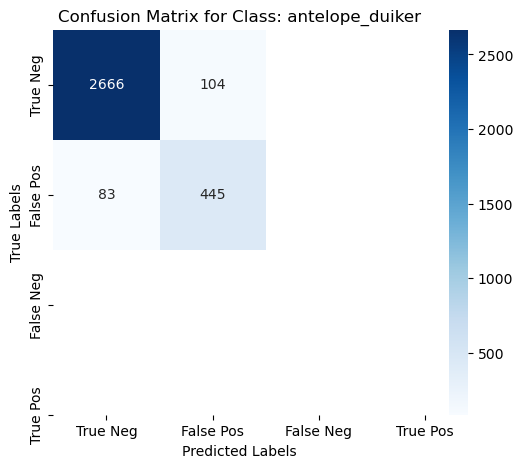

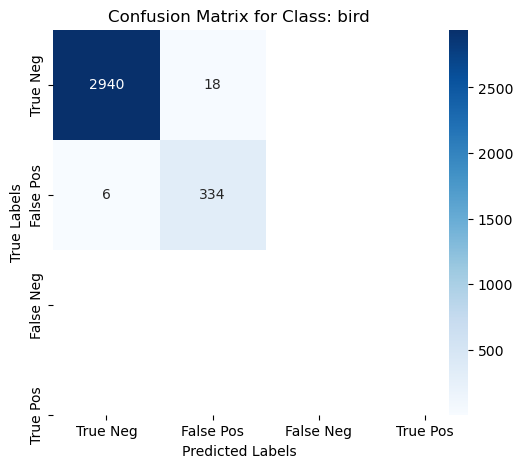

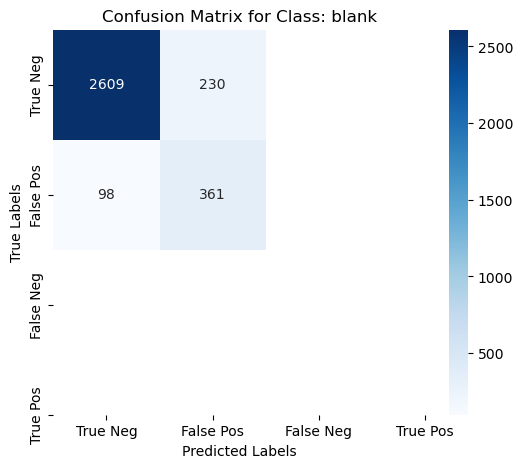

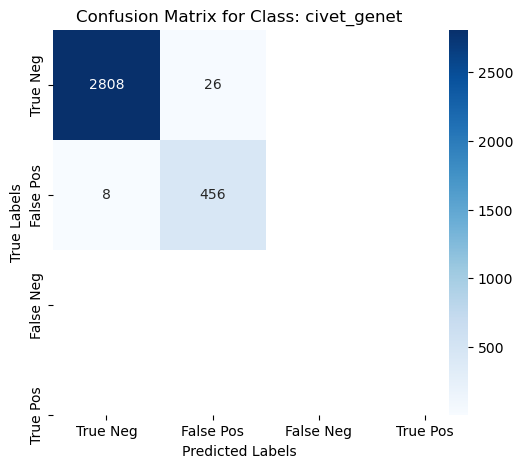

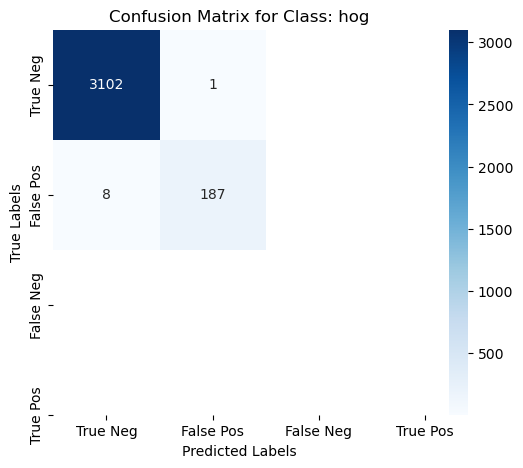

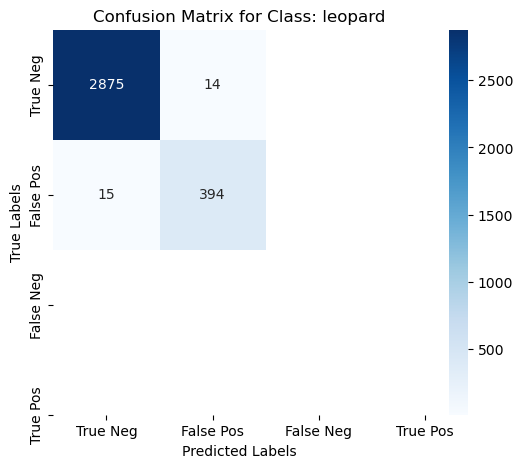

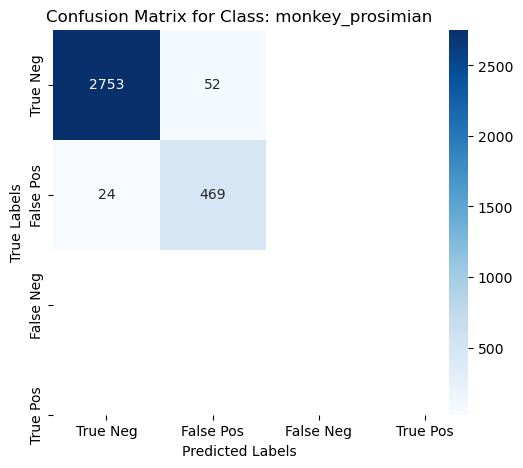

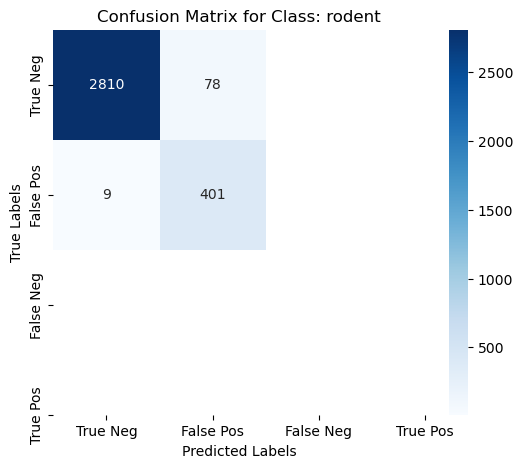

In [36]:
from sklearn.metrics import multilabel_confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_multilabel_confusion_matrix(y_true, y_pred, class_names):
    # Menghitung confusion matrix untuk tiap kelas
    mcm = multilabel_confusion_matrix(y_true, y_pred)

    # Visualisasi confusion matrix untuk tiap kelas
    for i, cm in enumerate(mcm):
        plt.figure(figsize=(6, 5))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                    xticklabels=["True Neg", "False Pos", "False Neg", "True Pos"],
                    yticklabels=["True Neg", "False Pos", "False Neg", "True Pos"])
        plt.title(f"Confusion Matrix for Class: {class_names[i]}")
        plt.xlabel('Predicted Labels')
        plt.ylabel('True Labels')
        plt.show()

# Menampilkan confusion matrix multilabel untuk semua kelas
plot_multilabel_confusion_matrix(all_targets, binary_preds, class_names=label_columns)

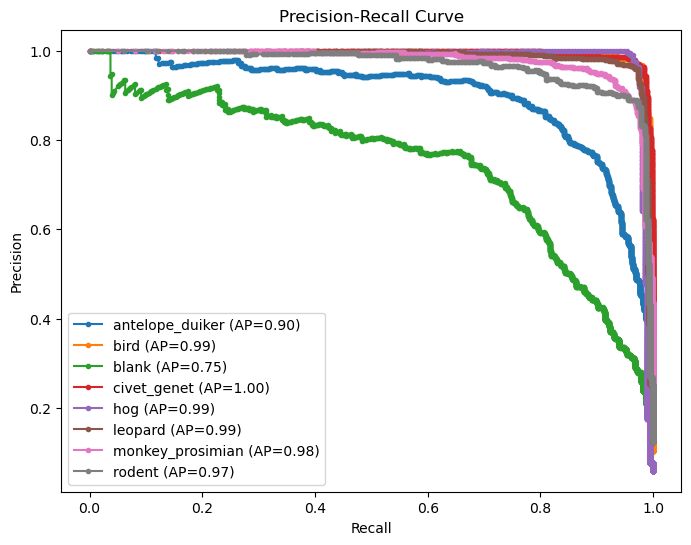

In [39]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score

def plot_precision_recall_curve(y_true, y_score, class_names):
    plt.figure(figsize=(8, 6))

    # Menghitung precision dan recall untuk setiap kelas
    for i in range(y_true.shape[1]):  # Untuk setiap kelas
        precision, recall, _ = precision_recall_curve(y_true[:, i], y_score[:, i])
        avg_precision = average_precision_score(y_true[:, i], y_score[:, i])

        plt.plot(recall, precision, marker='.', label=f'{class_names[i]} (AP={avg_precision:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Precision-Recall Curve')
    plt.legend()
    plt.show()

# Menggunakan hasil prediksi probabilitas
plot_precision_recall_curve(all_targets, all_preds, label_columns)

## Deployment

In [41]:
# 1. Setup Device
# ==============================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [43]:
# 2. Definisikan Model
# ==============================
class DeeperMultiLabelModel(torch.nn.Module):
    def __init__(self, num_classes):
        super(DeeperMultiLabelModel, self).__init__()
        self.model = models.resnet18(pretrained=True)
        self.model.fc = torch.nn.Linear(self.model.fc.in_features, num_classes)

    def forward(self, x):
        return self.model(x)

In [45]:
# 3. Load Model dan Deteksi Output
# ==============================
# Load model sementara untuk dapatkan jumlah output
temp_model = DeeperMultiLabelModel(num_classes=8)  # asumsi awal
temp_model.load_state_dict(torch.load("multilabel_resnet18_epoch50.pth", map_location=device))
temp_model.eval()
with torch.no_grad():
    dummy_input = torch.randn(1, 3, 224, 224).to(device)
    dummy_output = temp_model(dummy_input)
    num_classes = dummy_output.shape[1]
del temp_model

# Load model final
model = DeeperMultiLabelModel(num_classes=num_classes)
model.load_state_dict(torch.load("multilabel_resnet18_epoch50.pth", map_location=device))
model.to(device)
model.eval()

C:\Users\Joel\anaconda3\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Joel\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


DeeperMultiLabelModel(
  (model): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tru

In [47]:
# 4. Transformasi Gambar
# ==============================
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [49]:
# 5. Inference Folder
# ==============================
test_folder = "test_features"
image_files = [f for f in os.listdir(test_folder) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

results = []

with torch.no_grad():
    for img_file in image_files:
        img_path = os.path.join(test_folder, img_file)
        image = Image.open(img_path).convert("RGB")
        image = transform(image).unsqueeze(0).to(device)

        output = model(image)
        probs = torch.sigmoid(output).cpu().numpy()[0]
        preds = (probs >= 0.5).astype(int)

        result = {"filename": img_file}
        for i in range(num_classes):
            result[f"label_{i}"] = preds[i]
        results.append(result)

In [50]:
# 6. Simpan ke CSV
# ==============================
df = pd.DataFrame(results)
df.to_csv("prediksi_test_features.csv", index=False)
print("✅ Hasil prediksi disimpan ke 'prediksi_test_features.csv'")

✅ Hasil prediksi disimpan ke 'prediksi_test_features.csv'


## Visualization Actual and Predicted

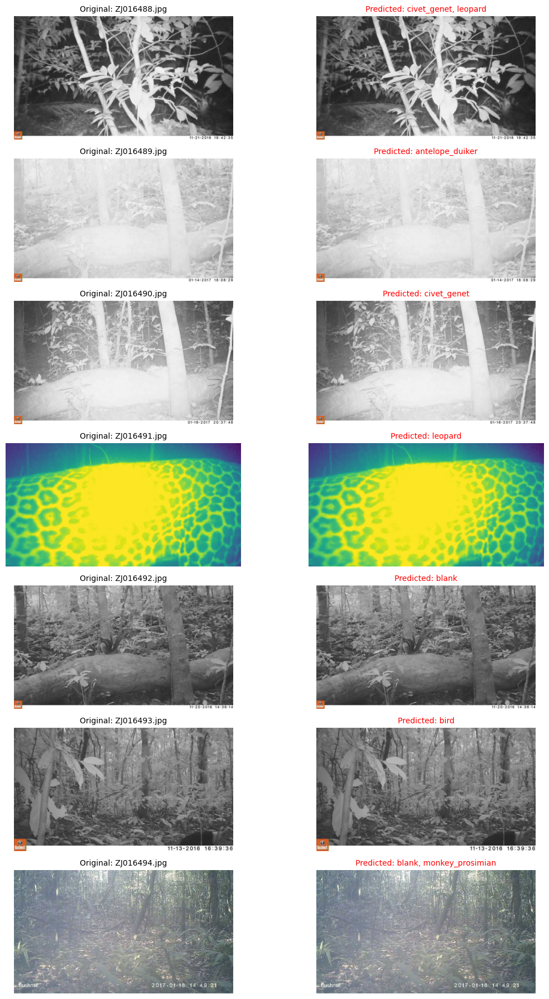

In [53]:
import matplotlib.pyplot as plt
# Visualisasi hasil prediksi
# Mapping index label ke nama kategori hewan
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

plt.figure(figsize=(12, 18))
samples_to_plot = results[:7]  # tampilkan 6 gambar

for idx, res in enumerate(samples_to_plot):
    img_path = os.path.join(test_folder, res["filename"])
    img = Image.open(img_path)

    # Ambil label prediksi berdasarkan nilai 1
    pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    pred_text = ", ".join(pred_names) if pred_names else "None"

    # Gambar original
    plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
    plt.imshow(img)
    plt.title(f"Original: {res['filename']}", fontsize=10)
    plt.axis('off')

    # Gambar prediksi
    plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
    plt.imshow(img)
    plt.title(f"Predicted: {pred_text}", fontsize=10, color='red')
    plt.axis('off')

plt.tight_layout()
plt.savefig("perbandingan_prediksi_dengan_nama_hewan.png")
plt.show()


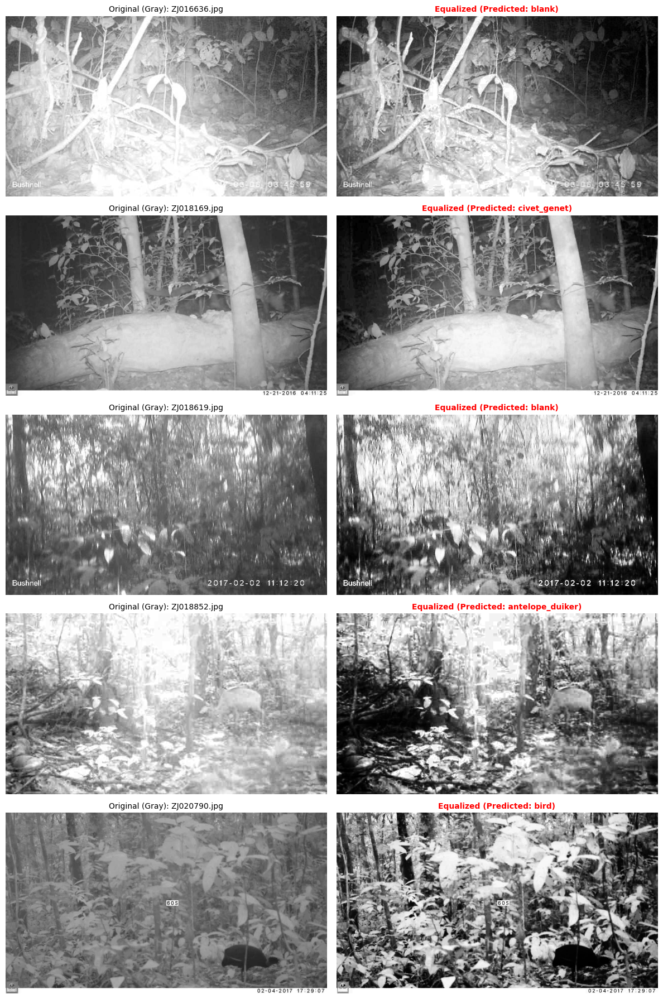

In [83]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image, ImageOps
import cv2  # For histogram equalization

# Mapping index label to animal category
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

# Visualizing the results
plt.figure(figsize=(12, 18))

# Randomly select 8 samples to plot
samples_to_plot = np.random.choice(results, size=5, replace=False)

for idx, res in enumerate(samples_to_plot):
    img_path = os.path.join(test_folder, res["filename"])
    img = Image.open(img_path)

    # Convert the image to grayscale
    img_gray = img.convert("L")

    # Convert grayscale image to numpy array for histogram equalization
    img_gray_np = np.array(img_gray)

    # Apply Histogram Equalization using OpenCV
    img_eq = cv2.equalizeHist(img_gray_np)

    # Convert back to PIL image
    img_eq = Image.fromarray(img_eq)

    # Get predicted label names based on predicted values of 1
    pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    pred_text = ", ".join(pred_names) if pred_names else "Blank"

    # Display original image
    plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title(f"Original (Gray): {res['filename']}", fontsize=10)
    plt.axis('off')

    # Display histogram equalized image
    plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
    plt.imshow(img_eq, cmap='gray')
    plt.title(f"Equalized (Predicted: {pred_text})", fontsize=10, color='red', fontweight='bold')
    plt.axis('off')

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("perbandingan_prediksi_grayscale_eq.png")
plt.show()

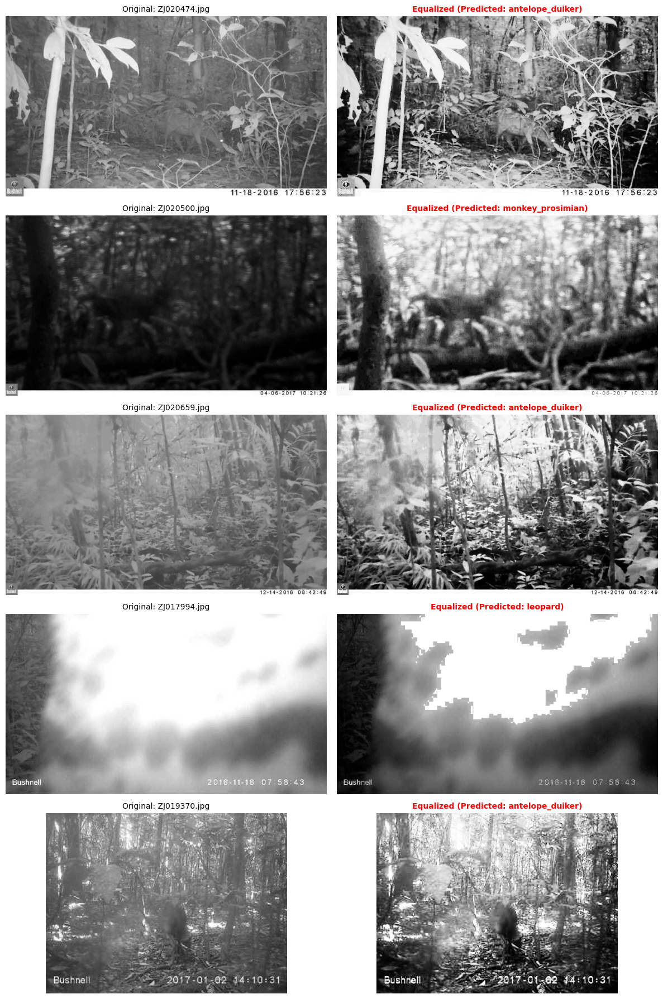

In [85]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import cv2  # For histogram equalization

# Mapping index label to animal category
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

# Filter out results where only 'blank' (label 2) is predicted
filtered_results = []
for res in results:
    active_labels = [i for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    if not (len(active_labels) == 1 and active_labels[0] == 2):  # only blank
        filtered_results.append(res)

# Jika kosong, beri info
if len(filtered_results) == 0:
    print("Semua hasil hanya memuat label 'blank'. Tidak ada gambar ditampilkan.")
else:
    # Visualisasi
    plt.figure(figsize=(12, 18))

    # Pilih sample acak dari hasil yang tidak blank
    samples_to_plot = np.random.choice(filtered_results, size=min(5, len(filtered_results)), replace=False)

    for idx, res in enumerate(samples_to_plot):
        img_path = os.path.join(test_folder, res["filename"])
        img = Image.open(img_path)

        # Convert to grayscale & apply equalization
        img_gray = img.convert("L")
        img_gray_np = np.array(img_gray)
        img_eq = cv2.equalizeHist(img_gray_np)
        img_eq = Image.fromarray(img_eq)

        # Ambil label prediksi
        pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1 and i != 2]
        pred_text = ", ".join(pred_names) if pred_names else "Unknown"

        # Original grayscale
        plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
        plt.imshow(img_gray, cmap='gray')
        plt.title(f"Original: {res['filename']}", fontsize=10)
        plt.axis('off')

        # Equalized
        plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
        plt.imshow(img_eq, cmap='gray')
        plt.title(f"Equalized (Predicted: {pred_text})", fontsize=10, color='red', fontweight='bold')
        plt.axis('off')

    # Tampilkan dan simpan hasil
    plt.tight_layout()
    plt.savefig("perbandingan_prediksi_tanpa_blank.png")
    plt.show()

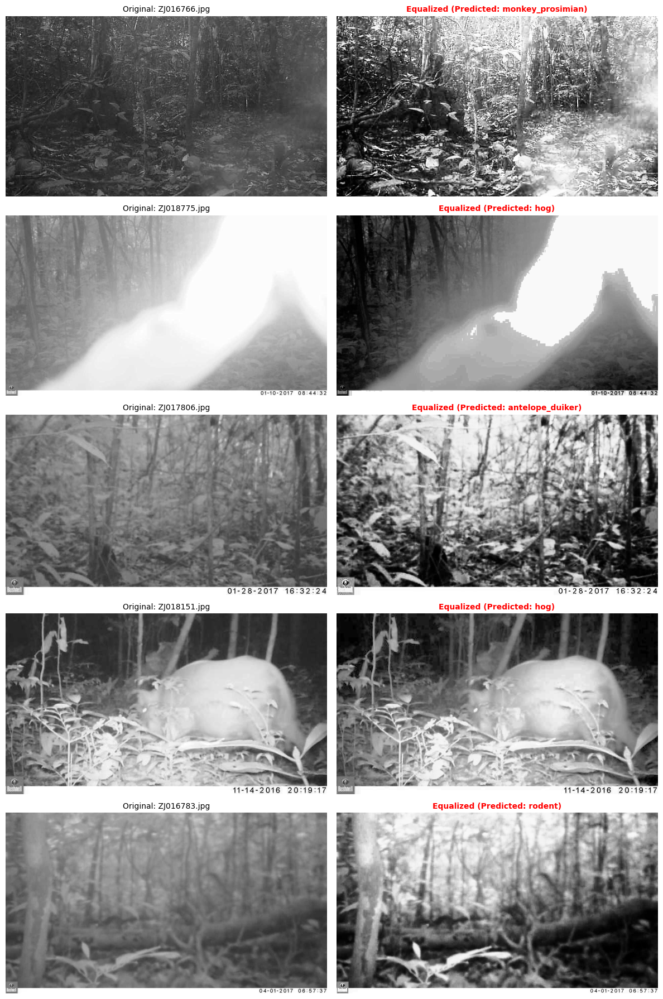

In [87]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import cv2  # For histogram equalization

# Mapping index label to animal category
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

# Filter out results where only 'blank' (label 2) is predicted
filtered_results = []
for res in results:
    active_labels = [i for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    if not (len(active_labels) == 1 and active_labels[0] == 2):  # only blank
        filtered_results.append(res)

# Jika kosong, beri info
if len(filtered_results) == 0:
    print("Semua hasil hanya memuat label 'blank'. Tidak ada gambar ditampilkan.")
else:
    # Visualisasi
    plt.figure(figsize=(12, 18))

    # Pilih sample acak dari hasil yang tidak blank
    samples_to_plot = np.random.choice(filtered_results, size=min(5, len(filtered_results)), replace=False)

    for idx, res in enumerate(samples_to_plot):
        img_path = os.path.join(test_folder, res["filename"])
        img = Image.open(img_path)

        # Convert to grayscale & apply equalization
        img_gray = img.convert("L")
        img_gray_np = np.array(img_gray)
        img_eq = cv2.equalizeHist(img_gray_np)
        img_eq = Image.fromarray(img_eq)

        # Ambil label prediksi
        pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1 and i != 2]
        pred_text = ", ".join(pred_names) if pred_names else "Unknown"

        # Original grayscale
        plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
        plt.imshow(img_gray, cmap='gray')
        plt.title(f"Original: {res['filename']}", fontsize=10)
        plt.axis('off')

        # Equalized
        plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
        plt.imshow(img_eq, cmap='gray')
        plt.title(f"Equalized (Predicted: {pred_text})", fontsize=10, color='red', fontweight='bold')
        plt.axis('off')

    # Tampilkan dan simpan hasil
    plt.tight_layout()
    plt.savefig("perbandingan_prediksi_tanpa_blank.png")
    plt.show()

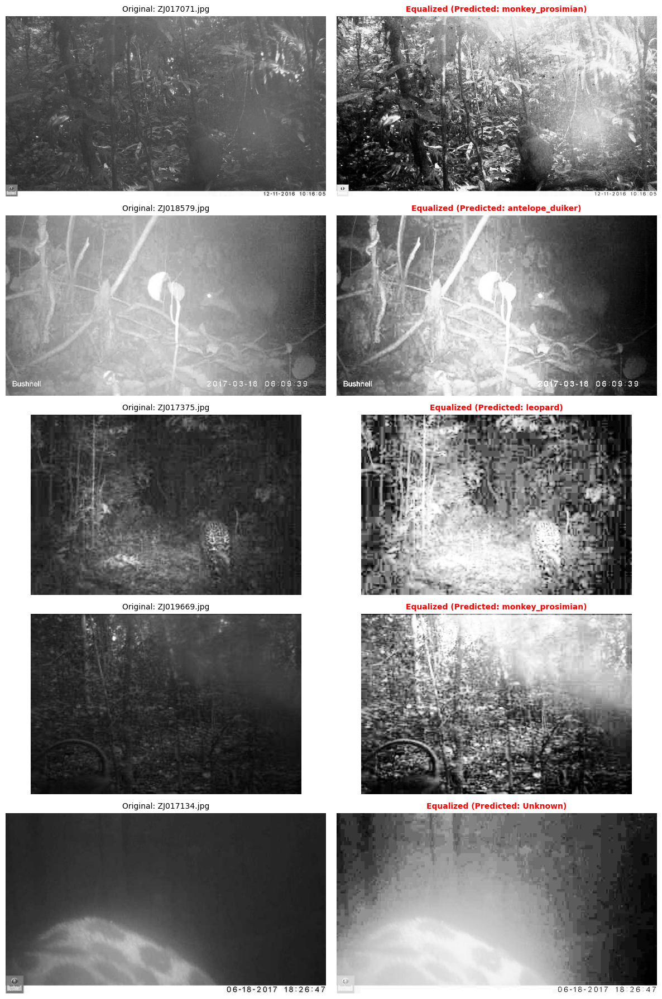

In [89]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import cv2  # For histogram equalization

# Mapping index label to animal category
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

# Filter out results where only 'blank' (label 2) is predicted
filtered_results = []
for res in results:
    active_labels = [i for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    if not (len(active_labels) == 1 and active_labels[0] == 2):  # only blank
        filtered_results.append(res)

# Jika kosong, beri info
if len(filtered_results) == 0:
    print("Semua hasil hanya memuat label 'blank'. Tidak ada gambar ditampilkan.")
else:
    # Visualisasi
    plt.figure(figsize=(12, 18))

    # Pilih sample acak dari hasil yang tidak blank
    samples_to_plot = np.random.choice(filtered_results, size=min(5, len(filtered_results)), replace=False)

    for idx, res in enumerate(samples_to_plot):
        img_path = os.path.join(test_folder, res["filename"])
        img = Image.open(img_path)

        # Convert to grayscale & apply equalization
        img_gray = img.convert("L")
        img_gray_np = np.array(img_gray)
        img_eq = cv2.equalizeHist(img_gray_np)
        img_eq = Image.fromarray(img_eq)

        # Ambil label prediksi
        pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1 and i != 2]
        pred_text = ", ".join(pred_names) if pred_names else "Unknown"

        # Original grayscale
        plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
        plt.imshow(img_gray, cmap='gray')
        plt.title(f"Original: {res['filename']}", fontsize=10)
        plt.axis('off')

        # Equalized
        plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
        plt.imshow(img_eq, cmap='gray')
        plt.title(f"Equalized (Predicted: {pred_text})", fontsize=10, color='red', fontweight='bold')
        plt.axis('off')

    # Tampilkan dan simpan hasil
    plt.tight_layout()
    plt.savefig("perbandingan_prediksi_tanpa_blank.png")
    plt.show()

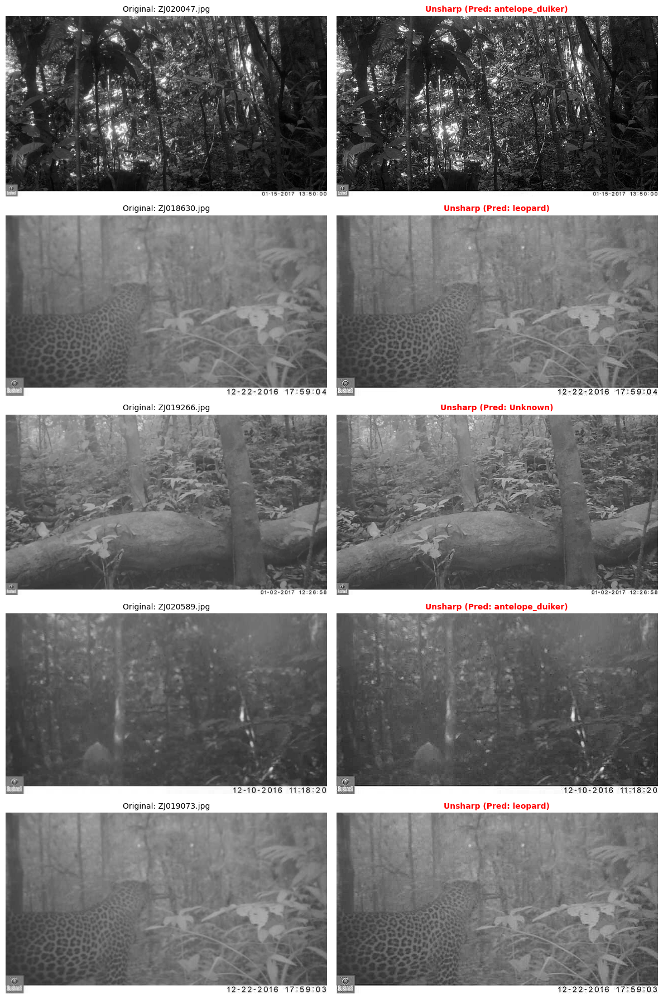

In [123]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import cv2  # Untuk Unsharp Masking

# Mapping label ke nama kategori
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

# Fungsi Unsharp Masking
def unsharp_mask(img, amount=1.5, blur_kernel=(5, 5)):
    blurred = cv2.GaussianBlur(img, blur_kernel, 0)
    sharpened = cv2.addWeighted(img, 1 + amount, blurred, -amount, 0)
    return sharpened

# Filter hasil prediksi non-blank
filtered_results = []
for res in results:
    active_labels = [i for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    if not (len(active_labels) == 1 and active_labels[0] == 2):  # Bukan hanya blank
        filtered_results.append(res)

# Tampilkan jika ada hasil non-blank
if len(filtered_results) == 0:
    print("Tidak ada gambar selain blank yang bisa ditampilkan.")
else:
    plt.figure(figsize=(12, 18))
    samples_to_plot = np.random.choice(filtered_results, size=min(5, len(filtered_results)), replace=False)

    for idx, res in enumerate(samples_to_plot):
        img_path = os.path.join(test_folder, res["filename"])
        img = Image.open(img_path)

        # Convert ke grayscale
        img_gray = img.convert("L")
        img_gray_np = np.array(img_gray)

        # Terapkan Unsharp Masking
        img_sharp = unsharp_mask(img_gray_np)

        # Ambil label prediksi (tanpa blank)
        pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1 and i != 2]
        pred_text = ", ".join(pred_names) if pred_names else "Unknown"

        # Gambar asli grayscale
        plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
        plt.imshow(img_gray, cmap='gray')
        plt.title(f"Original: {res['filename']}", fontsize=10)
        plt.axis('off')

        # Gambar setelah Unsharp Masking
        plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
        plt.imshow(img_sharp, cmap='gray')
        plt.title(f"Unsharp (Pred: {pred_text})", fontsize=10, color='red', fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig("UnsharpMasking_Prediksi_NonBlank.png")
    plt.show()


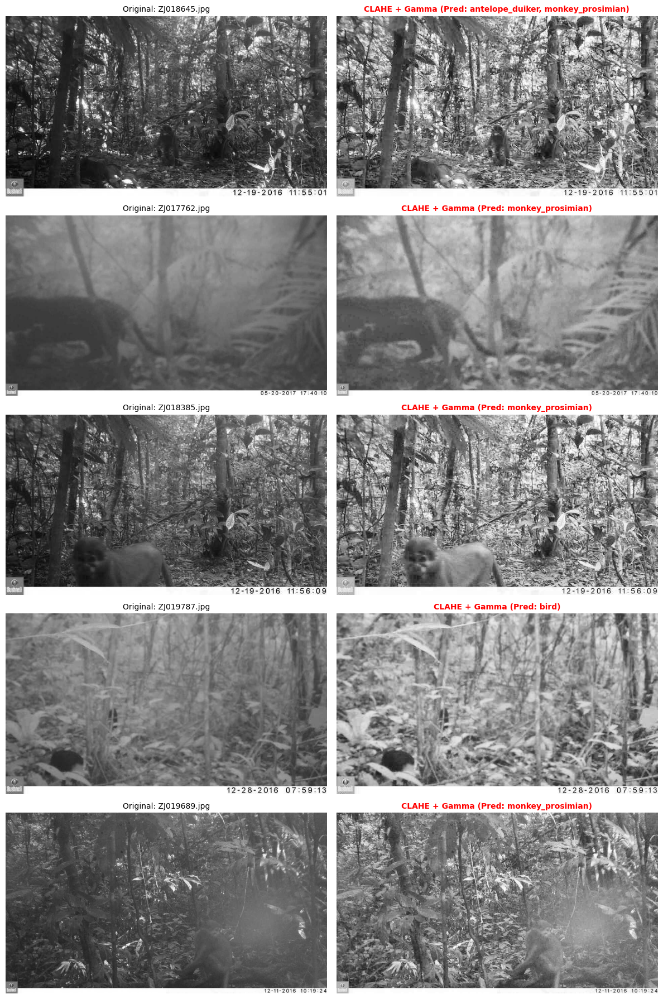

In [113]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import cv2  # Untuk CLAHE dan Gamma Correction

# Mapping label ke nama hewan
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

# Fungsi untuk gamma correction
def gamma_correction(img, gamma=1.5):
    invGamma = 1.0 / gamma
    table = np.array([((i / 255.0) ** invGamma) * 255 for i in np.arange(256)]).astype("uint8")
    return cv2.LUT(img, table)

# Filter hanya hasil yang tidak hanya label "blank"
filtered_results = []
for res in results:
    active_labels = [i for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    if not (len(active_labels) == 1 and active_labels[0] == 2):
        filtered_results.append(res)

# Jika tidak ada hasil selain blank
if len(filtered_results) == 0:
    print("Tidak ada gambar selain blank yang dapat ditampilkan.")
else:
    plt.figure(figsize=(12, 18))

    samples_to_plot = np.random.choice(filtered_results, size=min(5, len(filtered_results)), replace=False)

    for idx, res in enumerate(samples_to_plot):
        img_path = os.path.join(test_folder, res["filename"])
        img = Image.open(img_path)

        # Convert ke grayscale
        img_gray = img.convert("L")
        img_gray_np = np.array(img_gray)

        # Langkah 1: CLAHE
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        img_clahe = clahe.apply(img_gray_np)

        # Langkah 2: Gamma Correction setelah CLAHE
        img_clahe_gamma = gamma_correction(img_clahe, gamma=1.5)

        # Ambil label prediksi (selain blank)
        pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1 and i != 2]
        pred_text = ", ".join(pred_names) if pred_names else "Unknown"

        # Gambar asli (grayscale)
        plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
        plt.imshow(img_gray, cmap='gray')
        plt.title(f"Original: {res['filename']}", fontsize=10)
        plt.axis('off')

        # Gambar setelah CLAHE + Gamma
        plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
        plt.imshow(img_clahe_gamma, cmap='gray')
        plt.title(f"CLAHE + Gamma (Pred: {pred_text})", fontsize=10, color='red', fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig("CLAHE_Gamma_non_blank.png")
    plt.show()

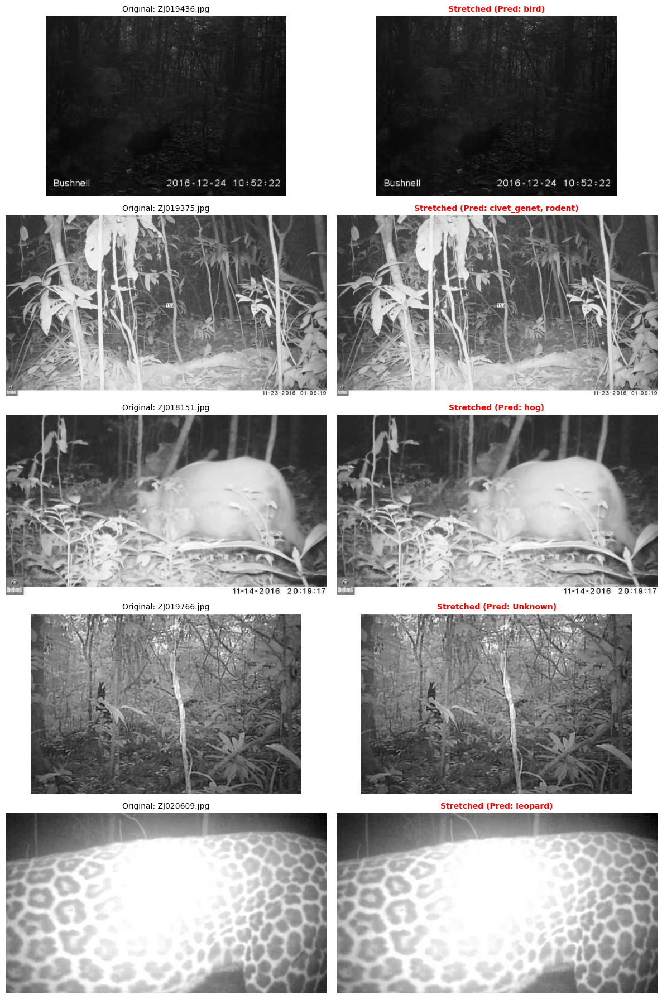

In [144]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import cv2  # untuk konversi jika diperlukan

# Mapping index ke kategori hewan
label_map = {
    0: "antelope_duiker",
    1: "bird",
    2: "blank",
    3: "civet_genet",
    4: "hog",
    5: "leopard",
    6: "monkey_prosimian",
    7: "rodent"
}

# Fungsi Histogram Stretching
def stretch_histogram(img):
    min_val = np.min(img)
    max_val = np.max(img)
    stretched = ((img - min_val) / (max_val - min_val) * 255).astype(np.uint8)
    return stretched

# Filter hanya prediksi non-blank
filtered_results = []
for res in results:
    active_labels = [i for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1]
    if not (len(active_labels) == 1 and active_labels[0] == 2):
        filtered_results.append(res)

# Visualisasi
if len(filtered_results) == 0:
    print("Tidak ada gambar selain blank yang bisa ditampilkan.")
else:
    plt.figure(figsize=(12, 18))
    samples_to_plot = np.random.choice(filtered_results, size=min(5, len(filtered_results)), replace=False)

    for idx, res in enumerate(samples_to_plot):
        img_path = os.path.join(test_folder, res["filename"])
        img = Image.open(img_path)

        # Konversi ke grayscale dan array
        img_gray = img.convert("L")
        img_gray_np = np.array(img_gray)

        # Terapkan Histogram Stretching
        img_stretched = stretch_histogram(img_gray_np)

        # Ambil label prediksi selain blank
        pred_names = [label_map[i] for i in range(len(label_map)) if res.get(f"label_{i}", 0) == 1 and i != 2]
        pred_text = ", ".join(pred_names) if pred_names else "Unknown"

        # Gambar original
        plt.subplot(len(samples_to_plot), 2, 2*idx + 1)
        plt.imshow(img_gray, cmap='gray')
        plt.title(f"Original: {res['filename']}", fontsize=10)
        plt.axis('off')

        # Gambar hasil Histogram Stretching
        plt.subplot(len(samples_to_plot), 2, 2*idx + 2)
        plt.imshow(img_stretched, cmap='gray')
        plt.title(f"Stretched (Pred: {pred_text})", fontsize=10, color='red', fontweight='bold')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig("HistogramStretching_Prediksi_NonBlank.png")
    plt.show()
